# Lab 7- Data Analysis

Exercises 1-4 are to be completed by October 25th. The remaider of the lab is due November 1st. Before leaving lab today, everyone must download the dataset.

## Exercise 1: Reading

### HiggsML
In 2014, some of my colleagues from the ATLAS experiment put together a Higgs Machine Learning Challenge, which was hosted on [Kaggle](https://www.kaggle.com). Please read sections 1 and 3 (skip/skim 2) of [The HiggsML Technical Documentation](https://higgsml.lal.in2p3.fr/files/2014/04/documentation_v1.8.pdf). 

Kaggle is a platform for data science competitions, with cash awards for winners. Kaggle currently hosts over 50,000 public datasets and associated competitions. Later in the course we will look at a variety of problems hosted on Kaggle and similar platforms. 

### SUSY Dataset

For the next few labs we will use datasets used in the [first paper on Deep Learning in High Energy physics](https://arxiv.org/pdf/1402.4735.pdf). Please read up to the "Deep Learning" section (end of page 5). This paper demonstrates that Deep Neural Networks can learn from raw data the features that are typically used by physicists for searches for exotics particles. The authors provide the data they used for this paper. They considered two benchmark scenarios: Higgs and SUSY.

## Exercise 2: Download SUSY Dataset

The information about the dataset can be found at the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/index.php). We'll start with the [SUSY Dataset](https://archive.ics.uci.edu/ml/datasets/SUSY). 

### Download
In a terminal, download the data directly from the source and then decompress it. For example:

* To download:
    * On Mac OS: 
    `curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz`

    * In linux:
    `wget http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz`

* To uncompress:
`gunzip SUSY.csv.gz`

In [3]:
!curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1091k    0 1091k    0     0   893k      0 --:--:--  0:00:01 --:--:--  898k
100 3964k    0 3964k    0     0  1789k      0 --:--:--  0:00:02 --:--:-- 1793k
100 5875k    0 5875k    0     0  1829k      0 --:--:--  0:00:03 --:--:-- 1832k
100 6993k    0 6993k    0     0  1662k      0 --:--:--  0:00:04 --:--:-- 1664k
100 8351k    0 8351k    0     0  1603k      0 --:--:--  0:00:05 --:--:-- 1680k
100 9809k    0 9809k    0     0  1576k      0 --:--:--  0:00:06 --:--:-- 1743k
100 11.4M    0 11.4M    0     0  1624k      0 --:--:--  0:00:07 --:--:-- 1551k
100 13.3M    0 13.3M    0     0  1658k      0 --:--:--  0:00:08 --:--:-- 1548k
100 15.5M    0 15.5M    0     0  1729k      0 --:--

In [11]:
!del SUSY.csv

In [1]:
!powershell -Command "& 'C:\Program Files\7-Zip\7z.exe' e SUSY.csv.gz"



7-Zip 24.07 (x64) : Copyright (c) 1999-2024 Igor Pavlov : 2024-06-19

Scanning the drive for archives:
1 file, 922377711 bytes (880 MiB)

Extracting archive: SUSY.csv.gz
--
Path = SUSY.csv.gz
Type = gzip
Headers Size = 19

Everything is Ok

Size:       2390277560
Compressed: 922377711


In [3]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"



Name        Size(MB)
----        --------
Lab.7.ipynb     0.38
Lab.7.pdf       5.83
SUSY.csv     2279.55
SUSY.csv.gz   879.65




The data is provided as a comma separated file.

In [4]:
filename = 'SUSY.csv'
with open(filename, 'r') as file:
    for i in range(5):
        print(file.readline().strip())


0.000000000000000000e+00,9.728614687919616699e-01,6.538545489311218262e-01,1.176224589347839355e+00,1.157156467437744141e+00,-1.739873170852661133e+00,-8.743090629577636719e-01,5.677649974822998047e-01,-1.750000417232513428e-01,8.100607395172119141e-01,-2.525521218776702881e-01,1.921887040138244629e+00,8.896374106407165527e-01,4.107718467712402344e-01,1.145620822906494141e+00,1.932632088661193848e+00,9.944640994071960449e-01,1.367815494537353516e+00,4.071449860930442810e-02
1.000000000000000000e+00,1.667973041534423828e+00,6.419061869382858276e-02,-1.225171446800231934e+00,5.061022043228149414e-01,-3.389389812946319580e-01,1.672542810440063477e+00,3.475464344024658203e+00,-1.219136357307434082e+00,1.295456290245056152e-02,3.775173664093017578e+00,1.045977115631103516e+00,5.680512785911560059e-01,4.819284379482269287e-01,0.000000000000000000e+00,4.484102725982666016e-01,2.053557634353637695e-01,1.321893453598022461e+00,3.775840103626251221e-01
1.000000000000000000e+00,4.4483992457389831

## Reducing the dataset

This is a rather large dataset. If you have trouble loading it, we can easily make a new file with less data.

Here we look at the size of the data

In [5]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"



Name        Size(MB)
----        --------
Lab.7.ipynb     0.38
Lab.7.pdf       5.83
SUSY.csv     2279.55
SUSY.csv.gz   879.65




We see that we have 5 million datapoints.

In [6]:
!powershell -Command "(Get-Content SUSY.csv | Measure-Object -Line).Lines"

5000000


We create a new file of the first half million. This is sufficient for our needs in this lab:

In [7]:
!powershell -Command "Get-Content SUSY.csv -TotalCount 500000 | Set-Content SUSY-small.csv"

In [8]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"


Name           Size(MB)
----           --------
Lab.7.ipynb        0.38
Lab.7.pdf          5.83
SUSY-small.csv   228.43
SUSY.csv        2279.55
SUSY.csv.gz      879.65




In [9]:
!powershell -Command "(Get-Content SUSY-small.csv | Measure-Object -Line).Lines"


500000


Use this file for the rest of the lab to make this run faster.

### First Look

Each row represents a LHC collision event. Each column contains some observable from that event. The variable names are ([based on documentation](https://archive.ics.uci.edu/ml/datasets/SUSY)):

In [4]:
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

Some of these variables represent the "raw" kinematics of the observed final state particles, while others are "features" that are derived from these raw quantities:

In [5]:
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [6]:
RawNames

['l_1_pT',
 'l_1_eta',
 'l_1_phi',
 'l_2_pT',
 'l_2_eta',
 'l_2_phi',
 'MET',
 'MET_phi']

In [7]:
FeatureNames

['axial_MET',
 'MET_rel',
 'M_R',
 'cos_theta_r1',
 'MT2',
 'dPhi_r_b',
 'M_TR_2',
 'R',
 'S_R',
 'M_Delta_R']

We will use pandas to read in the file, and matplotlib to make plots. The following ensures pandas is installed and sets everything up:

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

Now we can read the data into a pandas dataframe:

In [10]:
filename = "SUSY.csv"
df = pd.read_csv(filename, dtype='float64', names=VarNames)

You can see the data in Jupyter by just evaluateing the dataframe:

In [11]:
df

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999995,1.0,0.853325,-0.961783,-1.487277,0.678190,0.493580,1.647969,1.843867,0.276954,1.025105,-1.486535,0.892879,1.684429,1.674084,3.366298,1.046707,2.646649,1.389226,0.364599
4999996,0.0,0.951581,0.139370,1.436884,0.880440,-0.351948,-0.740852,0.290863,-0.732360,0.001360,0.257738,0.802871,0.545319,0.602730,0.002998,0.748959,0.401166,0.443471,0.239953
4999997,0.0,0.840389,1.419162,-1.218766,1.195631,1.695645,0.663756,0.490888,-0.509186,0.704289,0.045744,0.825015,0.723530,0.778236,0.752942,0.838953,0.614048,1.210595,0.026692
4999998,1.0,1.784218,-0.833565,-0.560091,0.953342,-0.688969,-1.428233,2.660703,-0.861344,2.116892,2.906151,1.232334,0.952444,0.685846,0.000000,0.781874,0.676003,1.197807,0.093689


The first column stores the "truth" label of whether an event was signal or not. Pandas makes it easy to create dataframes that store only the signal or background events:

In [11]:
df_sig=df[df.signal==1]
df_bkg=df[df.signal==0]

The following example plots the signal and background distributions of every variable. Note that we use VarNames[1:] to skip the first variable, which was the true label.

l_1_pT


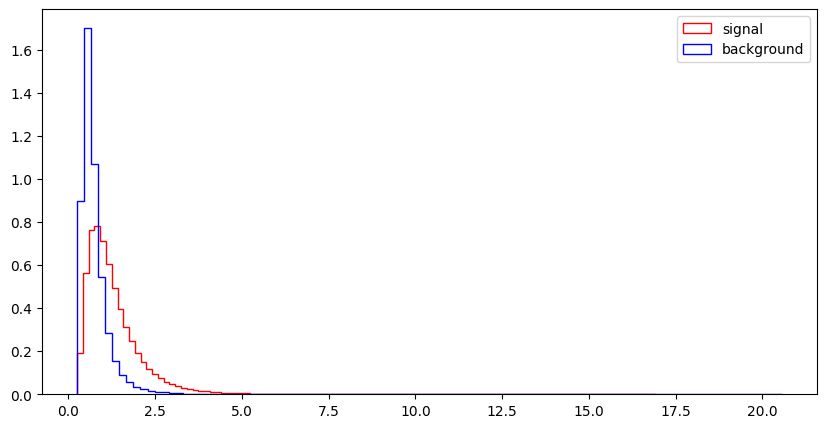

l_1_eta


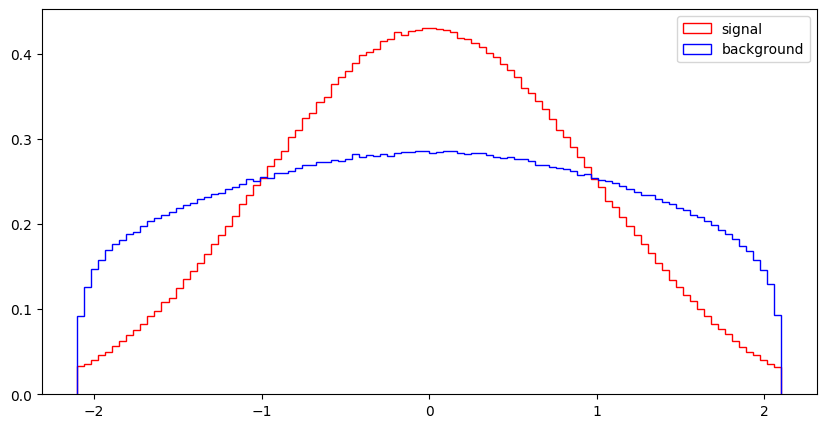

l_1_phi


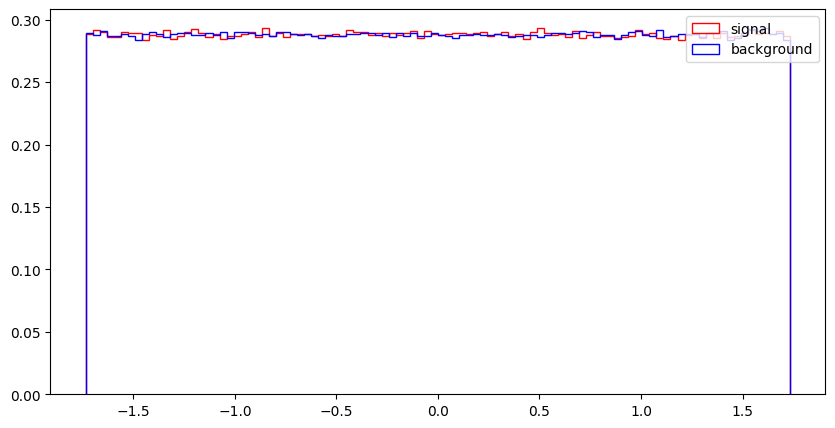

l_2_pT


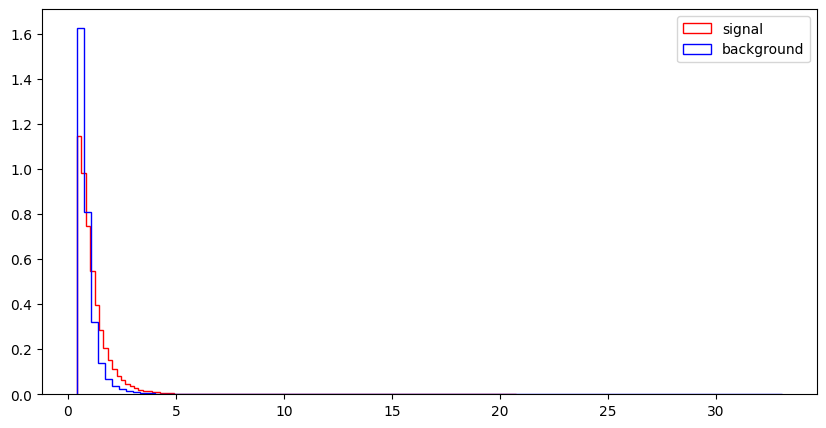

l_2_eta


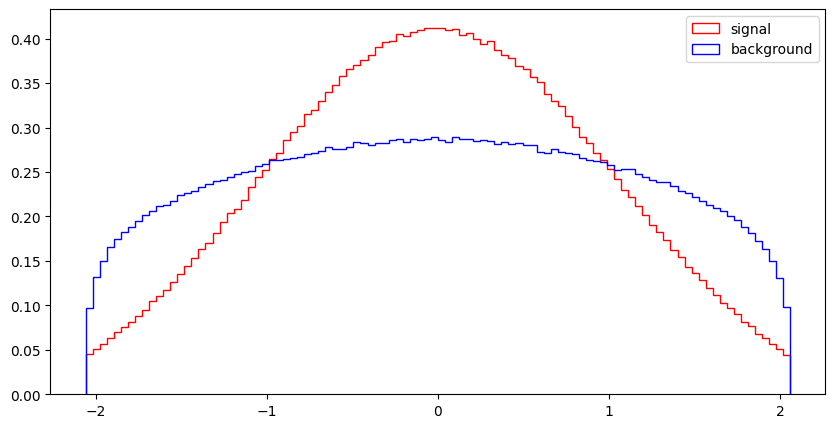

l_2_phi


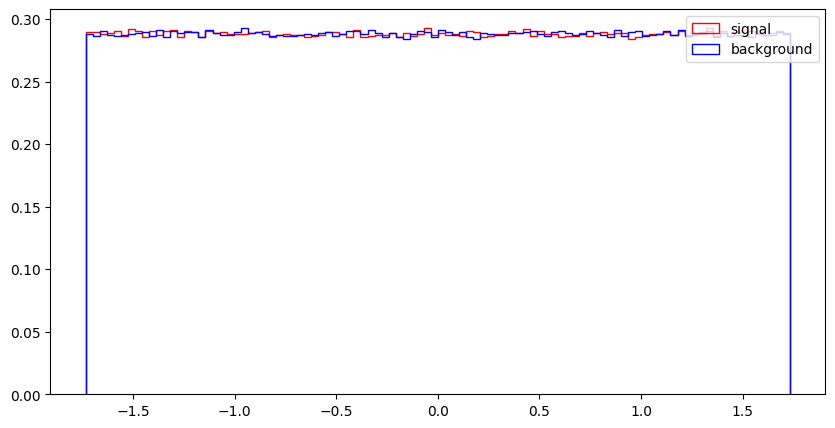

MET


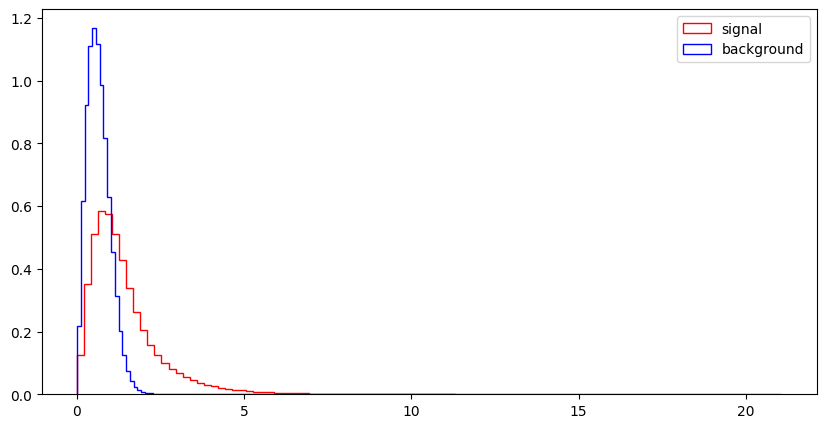

MET_phi


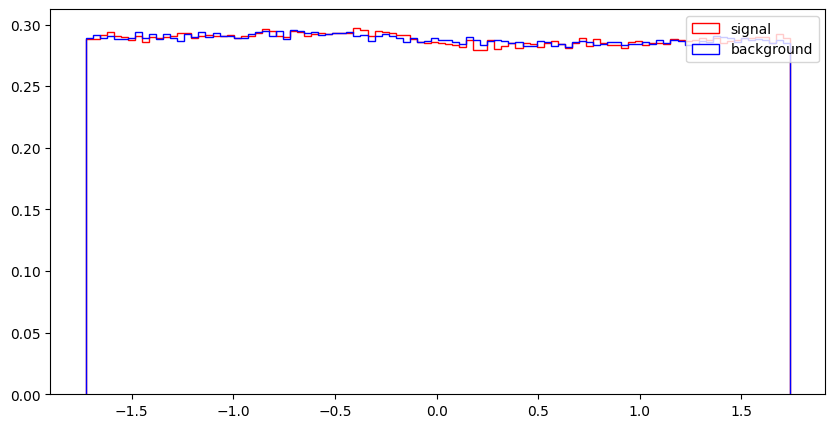

MET_rel


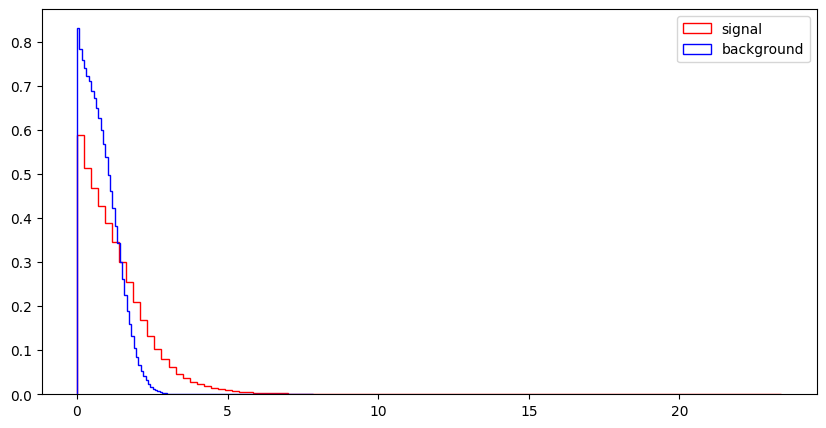

axial_MET


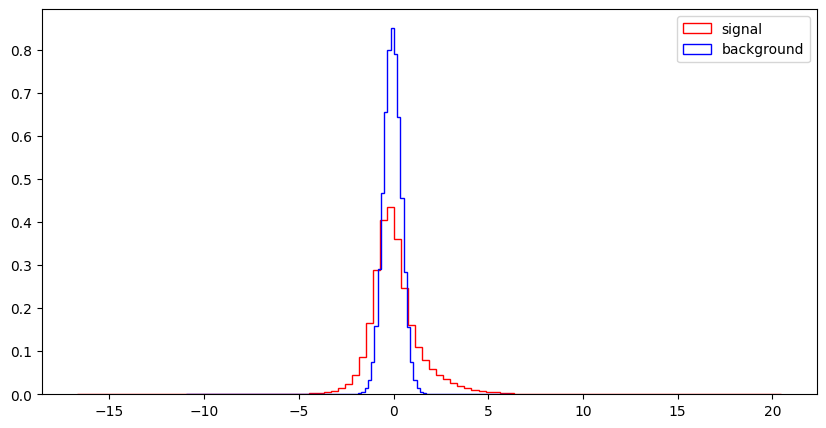

M_R


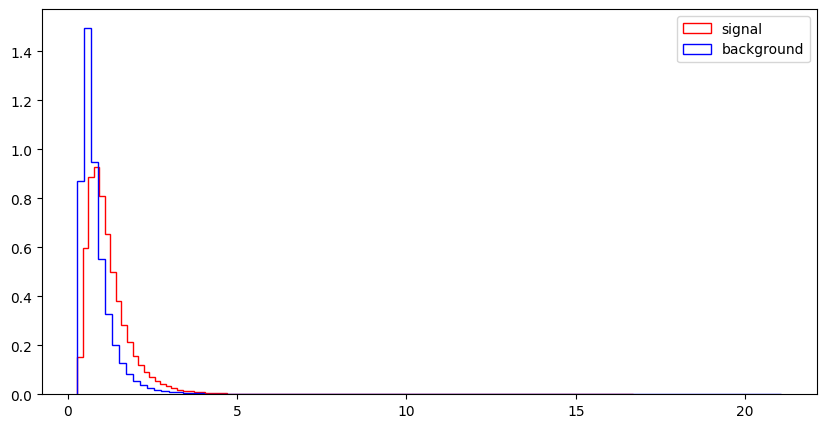

M_TR_2


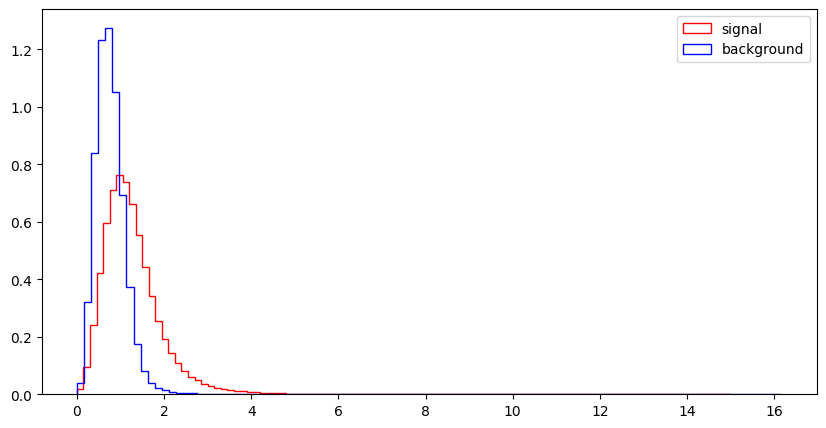

R


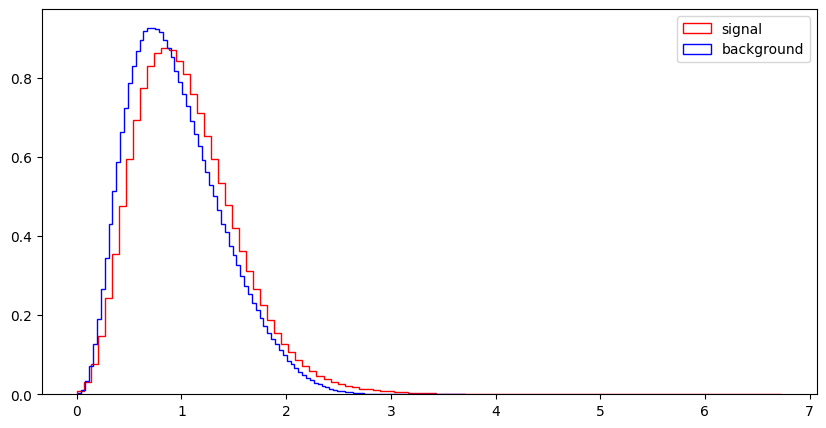

MT2


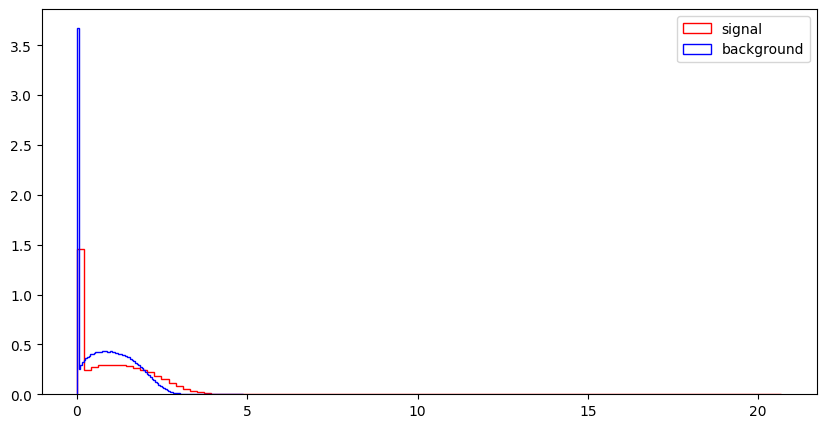

S_R


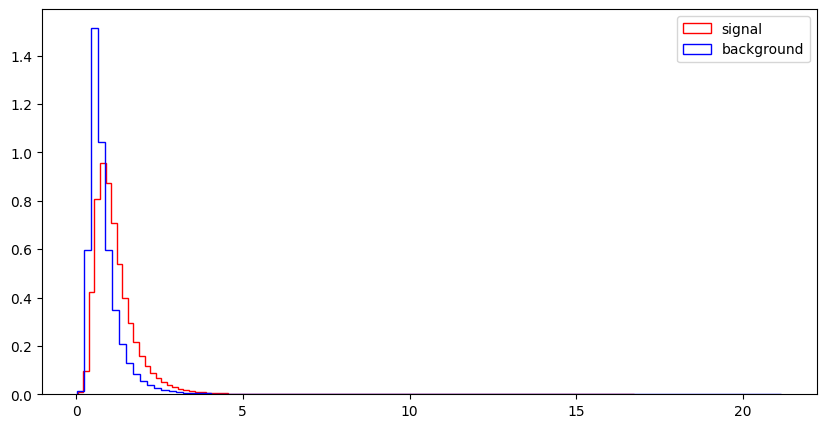

M_Delta_R


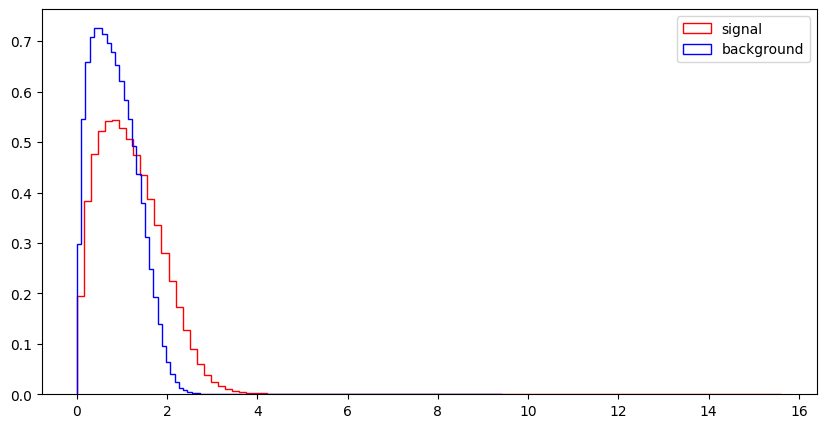

dPhi_r_b


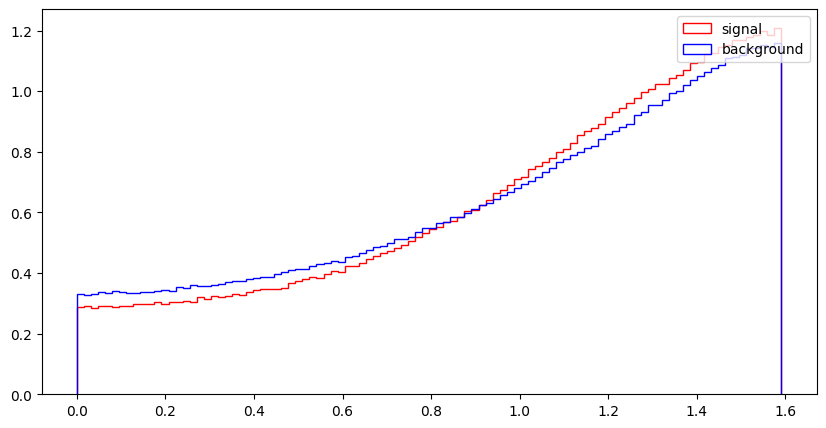

cos_theta_r1


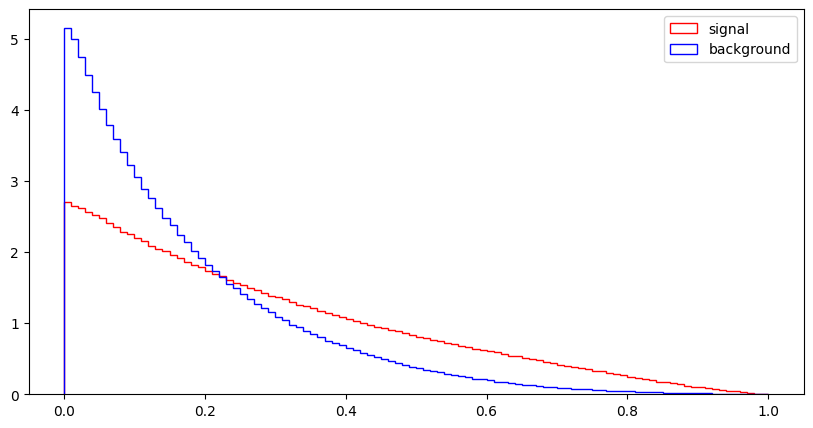

In [13]:
import numpy as np
for var in VarNames[1:]:
    print (var)
    plt.figure(figsize=(10,5))
    plt.hist(np.array(df_sig[var]),bins=100,histtype="step", color="red",label="signal",density=1, stacked=True)
    plt.hist(np.array(df_bkg[var]),bins=100,histtype="step", color="blue", label="background",density=1, stacked=True)
    plt.legend(loc='upper right')
    plt.show()

## Exercise 3: Make nice figures

Now use `matplotlib` to reproduce as closely as you can figures 5 and 6 from the paper. This exercise is intended to get you to familiarize yourself with making nicely formatted `matplotlib` figures with multiple plots. Note that the plots in the paper are actually wrong!

In [12]:
import pandas as pd

# Load the SUSY dataset
data = pd.read_csv('SUSY-small.csv', header=None)


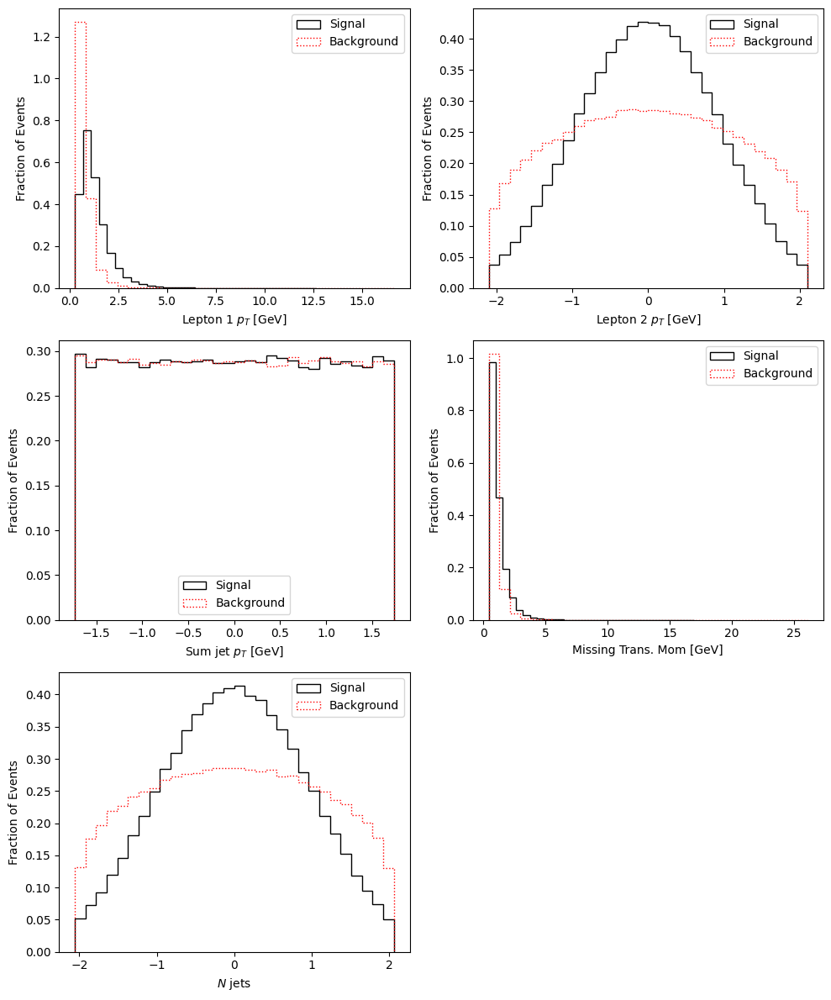

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

features = [
    ("Lepton 1 $p_T$ [GeV]", 1),
    ("Lepton 2 $p_T$ [GeV]", 2),
    ("Sum jet $p_T$ [GeV]", 3),
    ("Missing Trans. Mom [GeV]", 4),
    ("$N$ jets", 5)
]

fig, axs = plt.subplots(3, 2, figsize=(10, 12))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

# Hide the last empty subplot
axs[-1].axis('off')

plt.tight_layout()
plt.show()


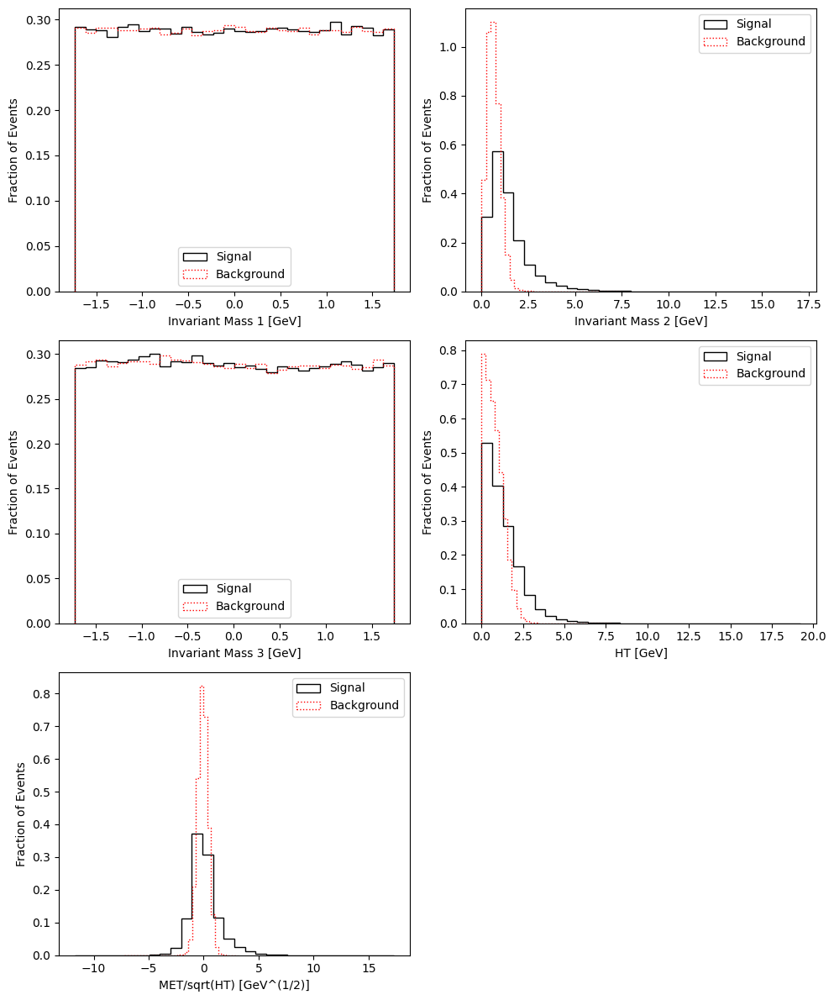

In [14]:
# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

# High-level features from the dataset
features = [
    ("Invariant Mass 1 [GeV]", 6),
    ("Invariant Mass 2 [GeV]", 7),
    ("Invariant Mass 3 [GeV]", 8),
    ("HT [GeV]", 9),
    ("MET/sqrt(HT) [GeV^(1/2)]", 10)
]

fig, axs = plt.subplots(3, 2, figsize=(10, 12))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

# Hide the last empty subplot
axs[-1].axis('off')

plt.tight_layout()
plt.show()


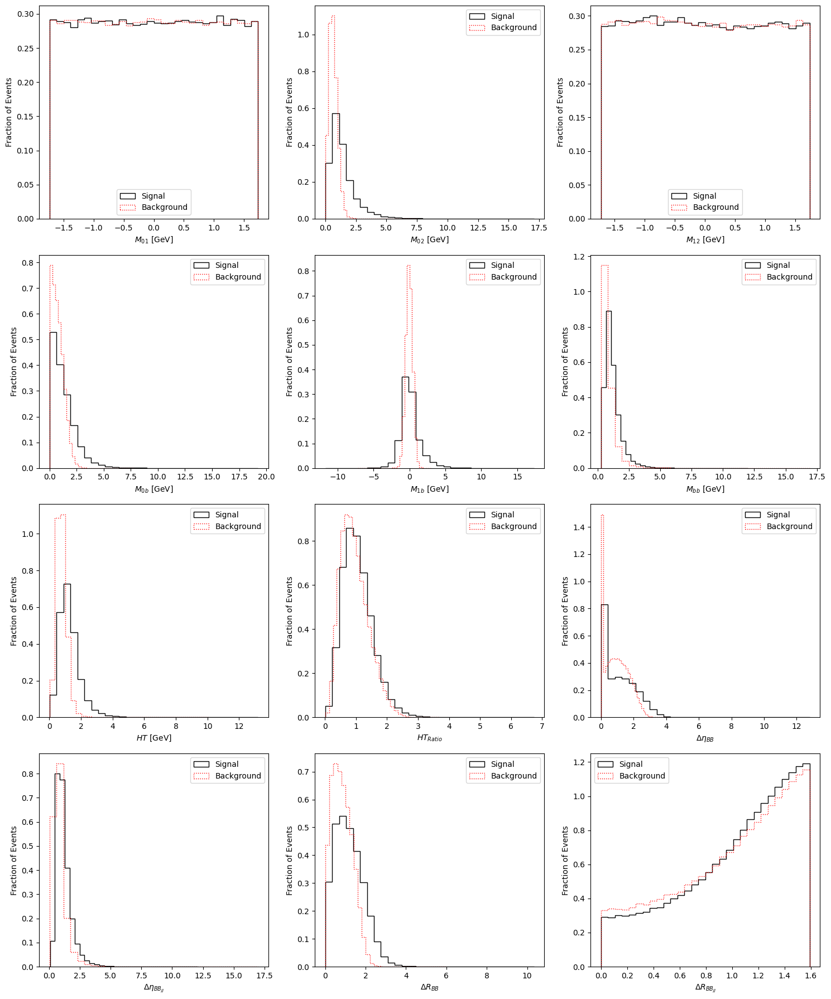

In [17]:
# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

# High-level features from the dataset
features = [
    ("$M_{01}$ [GeV]", 6),
    ("$M_{02}$ [GeV]", 7),
    ("$M_{12}$ [GeV]", 8),
    ("$M_{0b}$ [GeV]", 9),
    ("$M_{1b}$ [GeV]", 10),
    ("$M_{bb}$ [GeV]", 11),
    ("$HT$ [GeV]", 12),
    ("$HT_{Ratio}$", 13),
    ("$\\Delta\\eta_{BB}$", 14),
    ("$\\Delta\\eta_{BB_{JJ}}$", 15),
    ("$\\Delta R_{BB}$", 16),
    ("$\\Delta R_{BB_{JJ}}$", 17)
]

fig, axs = plt.subplots(4, 3, figsize=(15, 18))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

plt.tight_layout()
plt.show()


## Exercise 4: Correlation

### Exercise 4.1

#### Part a
Write a function that creates pair plots and use it to compare variables in the SUSY sample, separately for low and high-level features. Refer to Lecture 13 for details. Do not use `seaborn`.

#### Part b
Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

#### Part c
Which observables appear to be best for separating signal from background?

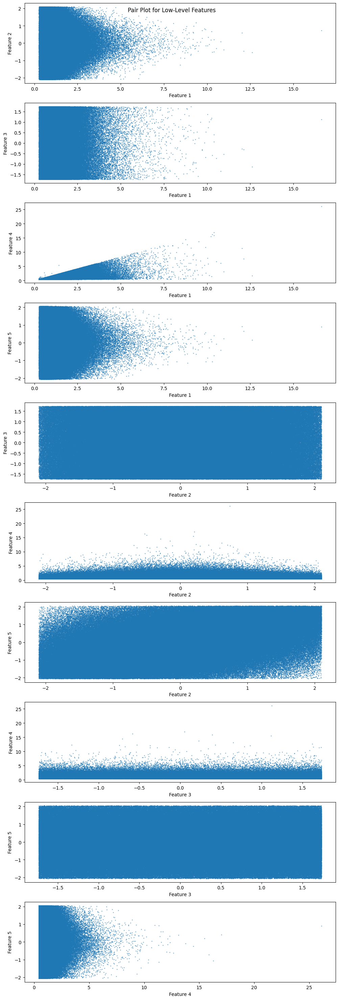

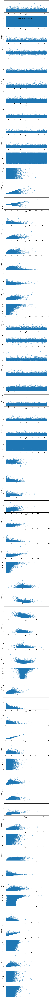

In [16]:
import itertools

# Separate low- and high-level features
low_level_features = data.iloc[:, 1:6]  # Columns 1 to 5 are low-level features
high_level_features = data.iloc[:, 6:18]  # Columns 6 to 17 are high-level features

def create_pair_plot(features, title):
    num_features = features.shape[1]
    feature_combinations = list(itertools.combinations(range(num_features), 2))
    
    fig, axs = plt.subplots(len(feature_combinations), figsize=(10, len(feature_combinations) * 3))
    
    for i, (x_idx, y_idx) in enumerate(feature_combinations):
        axs[i].scatter(features.iloc[:, x_idx], features.iloc[:, y_idx], s=1, alpha=0.5)
        axs[i].set_xlabel(f'Feature {x_idx + 1}')
        axs[i].set_ylabel(f'Feature {y_idx + 1}')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Create pair plots for low- and high-level features
create_pair_plot(low_level_features, "Pair Plot for Low-Level Features")
create_pair_plot(high_level_features, "Pair Plot for High-Level Features")



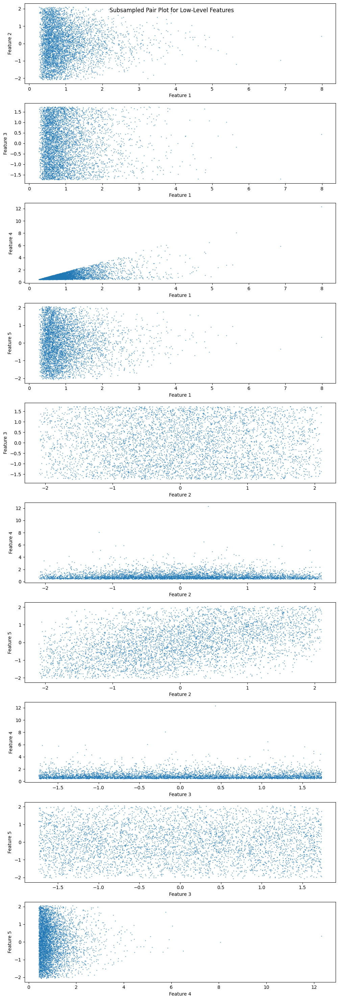

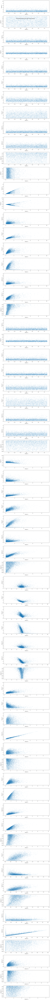

In [18]:
import random

def create_pair_plot_subsampled(features, title, sample_size=5000):
    num_features = features.shape[1]
    feature_combinations = list(itertools.combinations(range(num_features), 2))
    
    fig, axs = plt.subplots(len(feature_combinations), figsize=(10, len(feature_combinations) * 3))
    
    # Subsample the data to make it clearer
    sample_indices = random.sample(range(features.shape[0]), min(sample_size, features.shape[0]))
    sampled_features = features.iloc[sample_indices]
    
    for i, (x_idx, y_idx) in enumerate(feature_combinations):
        axs[i].scatter(sampled_features.iloc[:, x_idx], sampled_features.iloc[:, y_idx], s=1, alpha=0.5)
        axs[i].set_xlabel(f'Feature {x_idx + 1}')
        axs[i].set_ylabel(f'Feature {y_idx + 1}')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Sharper pair plot for low- and high-level features using subsampling
create_pair_plot_subsampled(low_level_features, "Subsampled Pair Plot for Low-Level Features")
create_pair_plot_subsampled(high_level_features, "Subsampled Pair Plot for High-Level Features")


In [20]:
# Feature names dictionary
feature_names = {
    1: "Lepton 1 $p_T$ [GeV]",
    2: "Lepton 2 $p_T$ [GeV]",
    3: "Sum jet $p_T$ [GeV]",
    4: "Missing Trans. Mom [GeV]",
    5: "$N$ jets",
    6: "$M_{01}$ [GeV]",
    7: "$M_{02}$ [GeV]",
    8: "$M_{12}$ [GeV]",
    9: "$M_{0b}$ [GeV]",
    10: "$M_{1b}$ [GeV]",
    11: "$M_{bb}$ [GeV]",
    12: "$HT$ [GeV]",
    13: "$HT_{Ratio}$",
    14: "$\\Delta\\eta_{BB}$",
    15: "$\\Delta\\eta_{BB_{JJ}}$",
    16: "$\\Delta R_{BB}$",
    17: "$\\Delta R_{BB_{JJ}}$"
}

# Calculate the correlation matrix for the entire dataset
correlation_matrix = data.corr()

# Calculate correlation for each feature with the label (column 0)
feature_correlations = correlation_matrix[0].iloc[1:]  # Exclude label itself

# Sort features based on the absolute correlation with the label (to find the most predictive ones)
sorted_features = feature_correlations.abs().sort_values(ascending=False)

# Display sorted features with actual names
print("Features sorted by correlation with the label (best separators):")
for feature, corr_value in sorted_features.items():
    feature_name = feature_names.get(feature, f"Feature {feature}")
    print(f"{feature_name}: Correlation = {corr_value:.3f}")



Features sorted by correlation with the label (best separators):
$M_{02}$ [GeV]: Correlation = 0.440
$HT$ [GeV]: Correlation = 0.426
Lepton 1 $p_T$ [GeV]: Correlation = 0.391
$M_{0b}$ [GeV]: Correlation = 0.283
$\Delta R_{BB}$: Correlation = 0.274
$M_{bb}$ [GeV]: Correlation = 0.270
Feature 18: Correlation = 0.267
$\Delta\eta_{BB_{JJ}}$: Correlation = 0.262
Missing Trans. Mom [GeV]: Correlation = 0.197
$HT_{Ratio}$: Correlation = 0.109
$\Delta\eta_{BB}$: Correlation = 0.080
$M_{1b}$ [GeV]: Correlation = 0.079
$\Delta R_{BB_{JJ}}$: Correlation = 0.033
$N$ jets: Correlation = 0.001
$M_{12}$ [GeV]: Correlation = 0.001
Sum jet $p_T$ [GeV]: Correlation = 0.000
Lepton 2 $p_T$ [GeV]: Correlation = 0.000
$M_{01}$ [GeV]: Correlation = 0.000


### Exercise 4.2

#### Part a
Install [tabulate](https://github.com/astanin/python-tabulate). 

#### Part b
Use numpy to compute the [covariance matrix](https://numpy.org/doc/stable/reference/generated/numpy.cov.html) and [correlation matrix](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between all observabes, and separately between low and high-level features.

#### Part c
Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

#### Part d
Write a function that takes a dataset and appropriate arguments and performs steps b and c.  

Hint: Example code for embedding a `tabulate` table into a notebook:

In [15]:
from IPython.display import HTML, display
import tabulate
table = [["A",1,2],
        ["C",3,4],
        ["D",5,6]]
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["X","Y","Z"])))

X,Y,Z
A,1,2
C,3,4
D,5,6


In [21]:
# Low-level and high-level features
low_level_features = data.iloc[:, 1:6]  # Columns 1 to 5
high_level_features = data.iloc[:, 6:18]  # Columns 6 to 17

# Covariance and correlation matrices for all features
cov_matrix_all = np.cov(data.iloc[:, 1:].values, rowvar=False)
corr_matrix_all = np.corrcoef(data.iloc[:, 1:].values, rowvar=False)

# Covariance and correlation matrices for low-level features
cov_matrix_low = np.cov(low_level_features.values, rowvar=False)
corr_matrix_low = np.corrcoef(low_level_features.values, rowvar=False)

# Covariance and correlation matrices for high-level features
cov_matrix_high = np.cov(high_level_features.values, rowvar=False)
corr_matrix_high = np.corrcoef(high_level_features.values, rowvar=False)


In [22]:
from IPython.display import HTML, display
import tabulate

# Create a function to format and display a table
def display_matrix(matrix, headers, title):
    table = [[f"{val:.3f}" for val in row] for row in matrix]
    html_table = tabulate.tabulate(table, tablefmt='html', headers=headers)
    display(HTML(f"<h3>{title}</h3>"))
    display(HTML(html_table))

# Headers for the features (for readability)
headers = [f"Feature {i+1}" for i in range(data.shape[1] - 1)]

# Display covariance and correlation matrices
display_matrix(cov_matrix_all, headers, "Covariance Matrix (All Features)")
display_matrix(corr_matrix_all, headers, "Correlation Matrix (All Features)")
display_matrix(cov_matrix_low, headers[:5], "Covariance Matrix (Low-Level Features)")
display_matrix(corr_matrix_low, headers[:5], "Correlation Matrix (Low-Level Features)")
display_matrix(cov_matrix_high, headers[5:], "Covariance Matrix (High-Level Features)")
display_matrix(corr_matrix_high, headers[5:], "Correlation Matrix (High-Level Features)")


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18
0.467,-0,0,0.305,-0,0.001,0.228,-0.001,0.098,-0.01,0.364,0.287,-0.06,-0.012,0.343,0.098,-0.047,0.022
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,-0.001,0,0,-0.001,-0.001,-0.001,0
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0,0.001,0.001,0.001,0.001,0
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002,-0.001,0.051,0.325,0.163,-0.099,-0.069,0.322,0.006,-0.004,-0.028
-0,0.408,0,-0.001,1.006,0,0,-0,0.001,-0.001,-0.001,0,0,0.001,-0.001,0.001,-0,0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0,0
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146,0.073
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002,0
0.098,-0.001,0.001,-0.001,0.001,0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.01,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001,0.16,-0.014,0.851,0.723,-0.186,-0.021,0.811,0.229,-0.157,0.165
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001,-0.002,-0.001,-0.001,-0.001,0.001,0,-0.001,-0.002,-0.002,0.002
0,-0.001,1,0.002,0,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0,0.001,0.002,0.001,0.002,0.001
0.684,-0,0.002,1,-0.001,0,0.14,-0.002,-0.001,0.078,0.797,0.43,-0.324,-0.123,0.799,0.014,-0.013,-0.217
-0.001,0.406,0,-0.001,1,0,0,-0,0.001,-0.001,-0.001,0,0.001,0.002,-0.001,0.001,-0.001,0.001
0.001,-0.001,-0.266,0,0,1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001,0
0.383,-0.002,0.001,0.14,0,-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383,0.425
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004,0.001
0.16,-0.002,0.001,-0.001,0.001,0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5
0.467,-0,0,0.305,-0
-0,1.004,-0.001,-0,0.408
0,-0.001,1.004,0.001,0
0.305,-0,0.001,0.425,-0.001
-0,0.408,0,-0.001,1.006


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5
1,-0.001,0,0.684,-0.001
-0.001,1,-0.001,-0,0.406
0,-0.001,1,0.002,0
0.684,-0,0.002,1,-0.001
-0.001,0.406,0,-0.001,1


Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17
1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0
-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146
-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002
0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146
-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025
0.001,0.145,-0.001,0.044,0.017,0.392,0.21,-0.113,-0.037,0.38,0.074,-0.029
0.001,0.365,-0.001,0.302,-0.185,0.21,0.338,0.104,0.189,0.228,0.242,0.058
0.001,0.188,-0,0.249,-0.181,-0.113,0.104,0.222,0.232,-0.083,0.165,0.087
0.002,0.155,0,0.409,-0.461,-0.037,0.189,0.232,0.738,-0.011,0.433,0.021
0.001,0.166,-0.002,0.082,-0.041,0.38,0.228,-0.083,-0.011,0.382,0.096,-0.003


Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17
1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001
-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383
-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004
0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378
-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057
0.001,0.264,-0.002,0.078,0.027,1,0.577,-0.383,-0.068,0.981,0.189,-0.106
0.001,0.72,-0.002,0.584,-0.317,0.577,1,0.38,0.379,0.635,0.668,0.229
0.001,0.457,-0,0.595,-0.383,-0.383,0.38,1,0.574,-0.287,0.564,0.424
0.003,0.206,0,0.535,-0.535,-0.068,0.379,0.574,1,-0.021,0.809,0.056
0.001,0.307,-0.003,0.15,-0.067,0.981,0.635,-0.287,-0.021,1,0.249,-0.013


In [23]:
def compute_and_display_cov_corr(data):
    # Split into low and high-level features
    low_level_features = data.iloc[:, 1:6]
    high_level_features = data.iloc[:, 6:18]

    # Compute covariance and correlation matrices
    matrices = {
        "Covariance Matrix (All Features)": np.cov(data.iloc[:, 1:].values, rowvar=False),
        "Correlation Matrix (All Features)": np.corrcoef(data.iloc[:, 1:].values, rowvar=False),
        "Covariance Matrix (Low-Level Features)": np.cov(low_level_features.values, rowvar=False),
        "Correlation Matrix (Low-Level Features)": np.corrcoef(low_level_features.values, rowvar=False),
        "Covariance Matrix (High-Level Features)": np.cov(high_level_features.values, rowvar=False),
        "Correlation Matrix (High-Level Features)": np.corrcoef(high_level_features.values, rowvar=False)
    }

    # Display matrices using tabulate
    headers = [f"Feature {i+1}" for i in range(data.shape[1] - 1)]
    for title, matrix in matrices.items():
        if "Low-Level" in title:
            display_matrix(matrix, headers[:5], title)
        elif "High-Level" in title:
            display_matrix(matrix, headers[5:], title)
        else:
            display_matrix(matrix, headers, title)

# Use the function
compute_and_display_cov_corr(data)


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18
0.467,-0,0,0.305,-0,0.001,0.228,-0.001,0.098,-0.01,0.364,0.287,-0.06,-0.012,0.343,0.098,-0.047,0.022
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,-0.001,0,0,-0.001,-0.001,-0.001,0
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0,0.001,0.001,0.001,0.001,0
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002,-0.001,0.051,0.325,0.163,-0.099,-0.069,0.322,0.006,-0.004,-0.028
-0,0.408,0,-0.001,1.006,0,0,-0,0.001,-0.001,-0.001,0,0,0.001,-0.001,0.001,-0,0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0,0
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146,0.073
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002,0
0.098,-0.001,0.001,-0.001,0.001,0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.01,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17,Feature 18
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001,0.16,-0.014,0.851,0.723,-0.186,-0.021,0.811,0.229,-0.157,0.165
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001,-0.002,-0.001,-0.001,-0.001,0.001,0,-0.001,-0.002,-0.002,0.002
0,-0.001,1,0.002,0,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0,0.001,0.002,0.001,0.002,0.001
0.684,-0,0.002,1,-0.001,0,0.14,-0.002,-0.001,0.078,0.797,0.43,-0.324,-0.123,0.799,0.014,-0.013,-0.217
-0.001,0.406,0,-0.001,1,0,0,-0,0.001,-0.001,-0.001,0,0.001,0.002,-0.001,0.001,-0.001,0.001
0.001,-0.001,-0.266,0,0,1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001,0
0.383,-0.002,0.001,0.14,0,-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383,0.425
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004,0.001
0.16,-0.002,0.001,-0.001,0.001,0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5
0.467,-0,0,0.305,-0
-0,1.004,-0.001,-0,0.408
0,-0.001,1.004,0.001,0
0.305,-0,0.001,0.425,-0.001
-0,0.408,0,-0.001,1.006


Feature 1,Feature 2,Feature 3,Feature 4,Feature 5
1,-0.001,0,0.684,-0.001
-0.001,1,-0.001,-0,0.406
0,-0.001,1,0.002,0
0.684,-0,0.002,1,-0.001
-0.001,0.406,0,-0.001,1


Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17
1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0
-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146
-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002
0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146
-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025
0.001,0.145,-0.001,0.044,0.017,0.392,0.21,-0.113,-0.037,0.38,0.074,-0.029
0.001,0.365,-0.001,0.302,-0.185,0.21,0.338,0.104,0.189,0.228,0.242,0.058
0.001,0.188,-0,0.249,-0.181,-0.113,0.104,0.222,0.232,-0.083,0.165,0.087
0.002,0.155,0,0.409,-0.461,-0.037,0.189,0.232,0.738,-0.011,0.433,0.021
0.001,0.166,-0.002,0.082,-0.041,0.38,0.228,-0.083,-0.011,0.382,0.096,-0.003


Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,Feature 13,Feature 14,Feature 15,Feature 16,Feature 17
1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001
-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383
-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004
0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378
-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057
0.001,0.264,-0.002,0.078,0.027,1,0.577,-0.383,-0.068,0.981,0.189,-0.106
0.001,0.72,-0.002,0.584,-0.317,0.577,1,0.38,0.379,0.635,0.668,0.229
0.001,0.457,-0,0.595,-0.383,-0.383,0.38,1,0.574,-0.287,0.564,0.424
0.003,0.206,0,0.535,-0.535,-0.068,0.379,0.574,1,-0.021,0.809,0.056
0.001,0.307,-0.003,0.15,-0.067,0.981,0.635,-0.287,-0.021,1,0.249,-0.013


## Exercise 5: Selection

### Exercise 5.1

Part a
By looking at the signal/background distributions for each observable (e.g. $x$) determine which selection criteria would be optimal: 

1. $x > x_c$
2. $x < x_c$
3. $|x - \mu| > x_c$
4. $|x - \mu| < x_c$

where $x_c$ is value to be determined below.

### Exercise 5.2

Plot the True Positive Rate (TPR) (aka signal efficiency $\epsilon_S(x_c)$) and False Positive Rate (FPR) (aka background efficiency $\epsilon_B(x_c)$) as function of $x_c$ for applying the strategy in part a to each observable. 

### Exercise 5.3
Assume 3 different scenarios corresponding to different numbers of signal and background events expected in data:

1. Expect $N_S=10$, $N_B=100$.
1. Expect $N_S=100$, $N_B=1000$.
1. Expect $N_S=1000$, $N_B=10000$.
1. Expect $N_S=10000$, $N_B=100000$.

Plot the significance ($\sigma_{S'}$) for each observable as function of $x_c$ for each scenario, where 

$\sigma_{S'}= \frac{N'_S}{\sqrt{N'_S+N'_B}}$

and $N'_{S,B} = \epsilon_{S,B}(x_c) * N_{S,B}$.

## Exercise 6: Cut Flow


### Exercise 6.1

For each above scenario, choose a subset (minumum 3) of observables to use for selections, and values of $x_c$ based on your significance plots (part 3c). 

### Exercise 6.2
Create a "cut-flow" table for each scenario where you successively make the selections on each observable and tabulate $\epsilon_S$, $\epsilon_B$, $N'_S$, $N'_B$, and $\sigma_{S'}$.

### Exercise 6.3
In 3c above you computed the significance for each observable assuming to make no other selections on any other observable. If the variables are correlated, then this assumption can lead to non-optimial results when selecting on multiple variables. By looking at the correlation matrices and your answers to 4b, identify where this effect could be most detrimental to the significance. Attempt to correct the issue by applying the selection in one observable and then optimizing (part 3c) for a second observable. What happens if you change the order of your selection (make selection on second and optimize on first)?




## Exercise 7: ROC Curves

### Exercise 7.1
For the top 3 observables you identified earlier, create one figure overlaying the Reciever Operating Characteristic (ROC) curves for the 3 observables. Compute the area under the curves and report it in the legend of the figure.

### Exercise 7.2
Write a function that you can use to quickly create the figure in part a with other observables and different conditions. Note that you will likely revise this function as you do the remainder of the lab.

### Exercise 7.3
Use the function from part b to compare the ROC curves for the successive selections in lab 3, exercise 4. Specifically, plot the ROC curve after each selection.

### Exercise 7.4
Use your function and appropriate example to demonstrate the effect (if any) of changing order of the successive selections.



## Exercise 8: Linear Discriminant

### Exercise 8.1

Using numpy, compute the between-class $\bf{S}_B$ and within-class $\bf{S}_W$ covariance matrices defined as:

$$
\bf{S}_B = (\bf{m_2}-\bf{m_1})(\bf{m_2}-\bf{m_1})^T \\
$$
$$
\bf{S}_W = \sum_{i=1,2} \sum_{n=1}^{l_i} (\bf{x}_n^i - \bf{m}_i) (\bf{x}_n^i - \bf{m}_i)^T
$$

where $\bf{m_i}$ are the vectors containing the means for category 1 and 2, here defined as signal and background. Here $\bf{x}_n^i$ is the vector containing the observables for the $n$th example event in category $i$.

### Exercise 8.1

Compute the linear coefficients $\bf{w} = \bf{S_W}^{-1}(\bf{m_2}-\bf{m_1})$. Compare the histogram of the distribution of $F_n^i=\bf{w}^T\bf{x}_n^i$ for the two categories.

### Exercise 8.1

Draw the ROC curve for $F_n$. 

### Exercise 8.1

What is the maximal significance you can obtain in the scenarios in exercise 5? 